In [2]:
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd 


In [2]:
print(pd.__version__)

2.0.3


In [3]:
print(np.__version__)

1.21.6


In [3]:
pip install numpy==1.21.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 27.0 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
Note: you may need to restart the kernel to use updated packages.


In [6]:
from platform import python_version

print(python_version())

3.11.3


In [4]:
os.chdir("/Users/lindalee/Desktop/")

load sparse matrix

In [5]:
X = io.mmread("/Users/lindalee/Desktop/day2_counts_08082023.mtx")

create Anndata object

adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

In [42]:
adata = anndata.AnnData(
    X=X.tocsr()
)

load cell metadata

In [9]:
cell_meta = pd.read_csv("/Users/lindalee/Desktop/day2_metadata_08082023.csv")
cell_meta

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,n.hkgene,avg.hkgene,RNA_snn_res.0.6,seurat_clusters,RNA_snn_res.0.9,RNA_snn_res.1.2,...,class_v8.tp,class_v8,idents,idents.tp,slingshot_pseudotime,RNA_snn_res.0.4,RNA_snn_res.0.25,barcode,UMAP_1,UMAP_2
0,1148_GEX_48h1_48h2_hashed_3GEX,8293,2942,0.081273,79,17.086022,7,1,3,19,...,others.48h_pD,others,non-neuronal,non-neuronal_48h_pD,4.770003,7,1,AAACCCAAGCCGGAAT_1,-0.004702,5.670187
1,1148_GEX_48h1_48h2_hashed_3GEX,1296,836,0.027006,70,3.172043,7,1,10,24,...,ES.48h_pD,ES,non-neuronal,non-neuronal_48h_pD,4.165831,7,1,AAACCCAAGGTCCTGC_1,-1.159366,1.906139
2,1148_GEX_48h1_48h2_hashed_3GEX,12799,3977,0.073678,77,18.236559,4,3,10,24,...,ES.48h_pD,ES,non-neuronal,non-neuronal_48h_pD,0.733521,4,3,AAACCCACATTAAGCC_1,-0.307841,-3.066644
3,1148_GEX_48h1_48h2_hashed_3GEX,656,508,0.080793,49,0.978495,7,3,0,5,...,mesoderm.48h_pD,mesoderm,non-neuronal,non-neuronal_48h_pD,3.478398,7,3,AAACCCAGTGAATTAG_1,-2.665565,-1.903341
4,1148_GEX_48h1_48h2_hashed_3GEX,3694,2000,0.099621,72,3.247312,10,2,8,13,...,mesoderm.48h_pD,mesoderm,non-neuronal,non-neuronal_48h_pD,8.175746,9,2,AAACCCATCATTTGGG_1,4.609927,-0.758662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7360,1148_GEX_48h1_48h2_hashed_3GEX,1730,954,0.032948,71,3.860215,7,1,3,6,...,others.48h_pD,others,non-neuronal,non-neuronal_48h_pD,6.366730,7,1,TTTGTTGAGTGAATAC_1,-1.252712,2.729790
7361,1148_GEX_48h1_48h2_hashed_3GEX,3563,2231,0.072692,71,2.731183,10,2,8,23,...,mesoderm.48h_pD,mesoderm,non-neuronal,non-neuronal_48h_pD,9.338396,9,2,TTTGTTGAGTGGCCTC_1,5.226419,-1.457766
7362,1148_GEX_48h1_48h2_hashed_3GEX,3279,1704,0.078378,69,5.526882,7,1,6,0,...,others.48h_pD,others,non-neuronal,non-neuronal_48h_pD,5.981197,7,1,TTTGTTGCACTTGTCC_1,0.795587,5.344112
7363,1148_GEX_48h1_48h2_hashed_3GEX,11152,3784,0.089491,79,17.526882,4,3,18,23,...,ES.48h_pD,ES,non-neuronal,non-neuronal_48h_pD,2.562763,4,3,TTTGTTGCATCCGAAT_1,1.810764,-3.261268


load gene names

In [10]:
with open("/Users/lindalee/Desktop/day2_gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()

set anndata observations and index obs by barcodes, var by gene names

In [11]:
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

In [12]:
adata.var.index

Index(['MIR1302-2HG', 'AL627309.1', 'AL669831.5', 'FAM87B', 'LINC00115',
       'FAM41C', 'AL645608.7', 'AL645608.3', 'AL645608.5', 'AL645608.1',
       ...
       'AF181450.1', 'AL158166.2', 'LINC02735', 'AP002991.2', 'AL359436.1',
       'AL135878.1', 'AL161851.1', 'AC104002.1', 'AL121584.1', 'AL451105.2'],
      dtype='object', length=31188)

load dimensional reduction

In [13]:
umap = pd.read_csv("/Users/lindalee/Desktop/day2_umap_coordinates.csv")
umap.index = adata.obs.index

rename index to allow for saving in hd5ad format

In [14]:
adata.obs.index.name = "cells"

set pca and umap

In [15]:
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T

UMAP colored by sampleID to test:

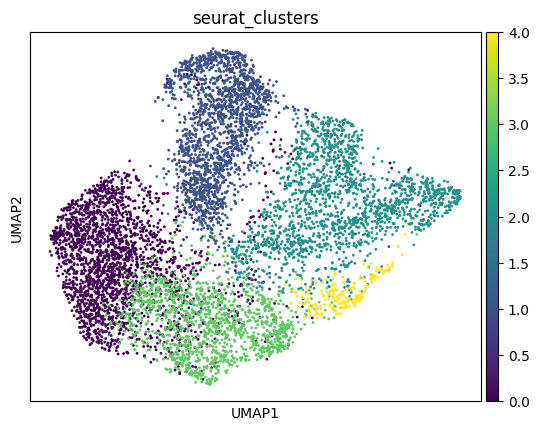

In [16]:
sc.pl.umap(adata, color=['seurat_clusters'], save='day2_seurat_clusters_scvelo_phate_w_frame.pdf')

save dataset as anndata format

In [17]:
adata.write('~/Desktop/day2_mito10_CC_regressed_from_integrated_data_adata_08082023.h5ad')

In [2]:
jupyter notebook --debug

SyntaxError: invalid syntax (1083300329.py, line 1)

In [18]:
adata.var.index

Index(['MIR1302-2HG', 'AL627309.1', 'AL669831.5', 'FAM87B', 'LINC00115',
       'FAM41C', 'AL645608.7', 'AL645608.3', 'AL645608.5', 'AL645608.1',
       ...
       'AF181450.1', 'AL158166.2', 'LINC02735', 'AP002991.2', 'AL359436.1',
       'AL135878.1', 'AL161851.1', 'AC104002.1', 'AL121584.1', 'AL451105.2'],
      dtype='object', length=31188)

reload dataset

In [19]:
adata = sc.read_h5ad('/Users/lindalee/Desktop/day2_mito10_CC_regressed_from_integrated_data_adata_08082023.h5ad')

In [17]:
adata

AnnData object with n_obs × n_vars = 39074 × 31188
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'n.hkgene', 'avg.hkgene', 'RNA_snn_res.0.6', 'seurat_clusters', 'RNA_snn_res.0.9', 'RNA_snn_res.1.2', 'RNA_snn_res.2.4', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.2', 'celltypeF', 'timepoint', 'folder', 'tx', 'cell.name', 'GAD.interneuron', 'GAD1.GAD2.SLC32A1', 'CALB1_exprs', 'CALB2_exprs', 'SST_exprs', 'PVALB_exprs', 'TH_exprs', 'RELN_exprs', 'HTR3A_exprs', 'VIP_exprs', 'annotation', 'MAP2.TUBB3.DCX', 'neuronal', 'SST.bi', 'neuronal.bi', 'GAD.interneuro.bi', 'n.int', 'number', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'MULTI_ID', 'MULTI_classification', 'dual_smad', 'HTO_maxID', 'hash.IDv2', 'nCount_SCT', 'nFeature_SCT', 'batch', 'SCT_snn_res.0.2', 'SCT_snn_res.0.6', 'SCT_snn_res.0.9', 'SCT_snn_res.1.2', 'SCT_snn_res.2.4', 'neuronal.1', 'GAD.interneuron.1', 'MAP2.SST.ISL1', 'MAP2.ISL1', 'MAP2.GATA2', 'MAP2.TSC22D1', 'MAP2.KLF6',

Now that we have our input data properly formatted, we can load it into python. Velocyto created a separate spliced and unspliced matrix for each sample, so we first have to merge the different samples into one object. Additionally, I am reformatting the cell barcodes to match my anndata object with the full genes-by-cells data.

In [10]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

ModuleNotFoundError: No module named 'scvelo'

In [4]:
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False)
cr.settings.verbosity = 2

load loom files for spliced/unspliced matrices for each sample:

In [20]:
ldata_48hr = anndata.read_loom('/Users/lindalee/Desktop/RNA_velocity/RNA_velocity_related_files/scRNAseq_loom_RH/48hr.loom')
ldata_day8 = anndata.read_loom('/Users/lindalee/Desktop/RNA_velocity/RNA_velocity_related_files/scRNAseq_loom_RH/Day8.loom')
ldata_wk1 = anndata.read_loom('/Users/lindalee/Desktop/RNA_velocity/RNA_velocity_related_files/scRNAseq_loom_RH/week1.loom')
ldata_wk2 = anndata.read_loom('/Users/lindalee/Desktop/RNA_velocity/RNA_velocity_related_files/scRNAseq_loom_RH/week2.loom')
ldata_wk3 = anndata.read_loom('/Users/lindalee/Desktop/RNA_velocity/RNA_velocity_related_files/scRNAseq_loom_RH/week3.loom')
ldata_wk4 = anndata.read_loom('/Users/lindalee/Desktop/RNA_velocity/RNA_velocity_related_files/scRNAseq_loom_RH/week4.loom')

/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not un

In [43]:
adata.T.write_csvs("/Users/lindalee/Desktop/adata_all6timepoints.csv")

/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [21]:
ldata_48hr.var_names_make_unique()
ldata_day8.var_names_make_unique()
ldata_wk1.var_names_make_unique()
ldata_wk2.var_names_make_unique()
ldata_wk3.var_names_make_unique()
ldata_wk4.var_names_make_unique()

In [32]:
adata.var.index

Index(['MIR1302-2HG', 'AL627309.1', 'AL669831.5', 'FAM87B', 'LINC00115',
       'FAM41C', 'AL645608.7', 'AL645608.3', 'AL645608.5', 'AL645608.1',
       ...
       'AF181450.1', 'AL158166.2', 'LINC02735', 'AP002991.2', 'AL359436.1',
       'AL135878.1', 'AL161851.1', 'AC104002.1', 'AL121584.1', 'AL451105.2'],
      dtype='object', length=31188)

make variable names unique

remove mouse genes from ldata1

In [22]:
ldata = ldata_48hr.concatenate([ldata_day8, ldata_wk1, ldata_wk2, ldata_wk3, ldata_wk4])

In [34]:
ldata.T.write_csvs("/Users/lindalee/Desktop/ldata_all6timepoints.csv")

writing .csv files to /Users/lindalee/Desktop/ldata_all6timepoints


In [23]:
ldata_genes_to_remove = pd.read_csv("/Users/lindalee/Desktop/ldata_genes_to_remove_alltimepoints_CSS.csv", header=None)
ldata_genes_to_remove

,0
0,GRCh38_AC145212.1
1,GRCh38_MAFIP
2,GRCh38_AC011043.2
3,GRCh38_AC011841.1
4,GRCh38_BX072566.1
...,...
6450,GRCh38_TTTY4B
6451,GRCh38_BPY2B
6452,GRCh38_DAZ4
6453,GRCh38_CDY1


In [24]:
human_genes_list = [name for name in ldata.var_names if not name.startswith('mm10___')]
ldata1_human_genes = ldata[:, human_genes_list]

In [25]:
mito_gene_indicator = np.in1d(ldata1_human_genes.var_names, ldata_genes_to_remove)
ldata1_genes_removed = ldata1_human_genes[:, ~mito_gene_indicator]

In [26]:
ldata1_genes_removed

View of AnnData object with n_obs × n_vars = 142224 × 30146
    obs: 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [27]:
adata_genes_to_remove = pd.read_csv("/Users/lindalee/Desktop/adata_genes_to_remove_alltimepoints_CSS.csv", header=None)
adata_genes_to_remove

,0
0,GRCh38_AL669831.5
1,GRCh38_AL645608.3
2,GRCh38_AL391244.3
3,GRCh38_FAM213B
4,GRCh38_LINC00982
...,...
1037,GRCh38_AC011477.4
1038,GRCh38_AC093227.2
1039,GRCh38_ZIM2-AS1
1040,GRCh38_AP000295.1


In [28]:
mito_gene_indicator = np.in1d(adata.var_names, adata_genes_to_remove)
adata_genes_removed = adata[:, ~mito_gene_indicator]

In [29]:
adata_genes_removed

View of AnnData object with n_obs × n_vars = 39074 × 30146
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'n.hkgene', 'avg.hkgene', 'RNA_snn_res.0.6', 'seurat_clusters', 'RNA_snn_res.0.9', 'RNA_snn_res.1.2', 'RNA_snn_res.2.4', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.2', 'celltypeF', 'timepoint', 'folder', 'tx', 'cell.name', 'GAD.interneuron', 'GAD1.GAD2.SLC32A1', 'CALB1_exprs', 'CALB2_exprs', 'SST_exprs', 'PVALB_exprs', 'TH_exprs', 'RELN_exprs', 'HTR3A_exprs', 'VIP_exprs', 'annotation', 'MAP2.TUBB3.DCX', 'neuronal', 'SST.bi', 'neuronal.bi', 'GAD.interneuro.bi', 'n.int', 'number', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'MULTI_ID', 'MULTI_classification', 'dual_smad', 'HTO_maxID', 'hash.IDv2', 'nCount_SCT', 'nFeature_SCT', 'batch', 'SCT_snn_res.0.2', 'SCT_snn_res.0.6', 'SCT_snn_res.0.9', 'SCT_snn_res.1.2', 'SCT_snn_res.2.4', 'neuronal.1', 'GAD.interneuron.1', 'MAP2.SST.ISL1', 'MAP2.ISL1', 'MAP2.GATA2', 'MAP2.TSC22D1', 'MAP

remove barcode for cells in adata and ldata to make equal

In [30]:
ldata_cells_to_remove = pd.read_csv("/Users/lindalee/Desktop/ldata_cells_to_remove.csv", header=None)

In [31]:
ldata_cells_indicator = np.in1d(ldata1_genes_removed.obs_names, ldata_cells_to_remove)
ldata1_cells_and_genes_removed = ldata1_genes_removed[~ldata_cells_indicator,:]

In [32]:
ldata1_cells_and_genes_removed

View of AnnData object with n_obs × n_vars = 38439 × 30146
    obs: 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [33]:
adata_cells_to_remove = pd.read_csv("/Users/lindalee/Desktop/adata_cells_to_remove.csv", header=None)

In [34]:
adata_cells_indicator = np.in1d(adata_genes_removed.obs_names, adata_cells_to_remove)
adata_cells_and_genes_removed = adata_genes_removed[~adata_cells_indicator,:]

In [35]:
adata_cells_and_genes_removed

View of AnnData object with n_obs × n_vars = 38439 × 30146
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'n.hkgene', 'avg.hkgene', 'RNA_snn_res.0.6', 'seurat_clusters', 'RNA_snn_res.0.9', 'RNA_snn_res.1.2', 'RNA_snn_res.2.4', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.2', 'celltypeF', 'timepoint', 'folder', 'tx', 'cell.name', 'GAD.interneuron', 'GAD1.GAD2.SLC32A1', 'CALB1_exprs', 'CALB2_exprs', 'SST_exprs', 'PVALB_exprs', 'TH_exprs', 'RELN_exprs', 'HTR3A_exprs', 'VIP_exprs', 'annotation', 'MAP2.TUBB3.DCX', 'neuronal', 'SST.bi', 'neuronal.bi', 'GAD.interneuro.bi', 'n.int', 'number', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'MULTI_ID', 'MULTI_classification', 'dual_smad', 'HTO_maxID', 'hash.IDv2', 'nCount_SCT', 'nFeature_SCT', 'batch', 'SCT_snn_res.0.2', 'SCT_snn_res.0.6', 'SCT_snn_res.0.9', 'SCT_snn_res.1.2', 'SCT_snn_res.2.4', 'neuronal.1', 'GAD.interneuron.1', 'MAP2.SST.ISL1', 'MAP2.ISL1', 'MAP2.GATA2', 'MAP2.TSC22D1', 'MAP

merge matrices into the original adata object

In [36]:
adata = scv.utils.merge(adata_cells_and_genes_removed, ldata1_cells_and_genes_removed, copy=True)

In [37]:
adata

AnnData object with n_obs × n_vars = 38439 × 30146
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'n.hkgene', 'avg.hkgene', 'RNA_snn_res.0.6', 'seurat_clusters', 'RNA_snn_res.0.9', 'RNA_snn_res.1.2', 'RNA_snn_res.2.4', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.2', 'celltypeF', 'timepoint', 'folder', 'tx', 'cell.name', 'GAD.interneuron', 'GAD1.GAD2.SLC32A1', 'CALB1_exprs', 'CALB2_exprs', 'SST_exprs', 'PVALB_exprs', 'TH_exprs', 'RELN_exprs', 'HTR3A_exprs', 'VIP_exprs', 'annotation', 'MAP2.TUBB3.DCX', 'neuronal', 'SST.bi', 'neuronal.bi', 'GAD.interneuro.bi', 'n.int', 'number', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'MULTI_ID', 'MULTI_classification', 'dual_smad', 'HTO_maxID', 'hash.IDv2', 'nCount_SCT', 'nFeature_SCT', 'batch', 'SCT_snn_res.0.2', 'SCT_snn_res.0.6', 'SCT_snn_res.0.9', 'SCT_snn_res.1.2', 'SCT_snn_res.2.4', 'neuronal.1', 'GAD.interneuron.1', 'MAP2.SST.ISL1', 'MAP2.ISL1', 'MAP2.GATA2', 'MAP2.TSC22D1', 'MAP2.KLF6',

plot umap to check

/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


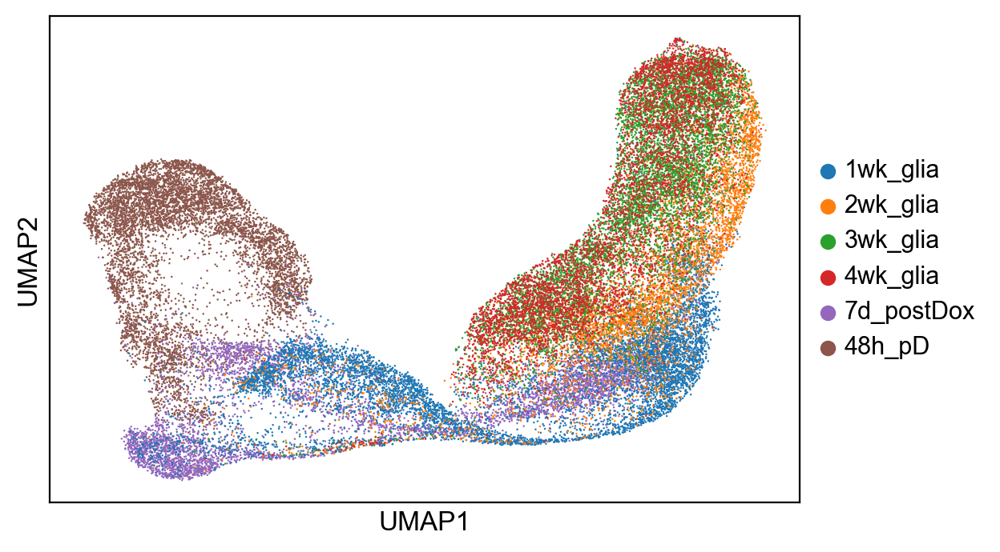

In [38]:
sc.pl.umap(adata, color=['timepoint'], title='', save='test.pdf')

Finally we can actually use scVelo to compute RNA velocity. scVelo allows the user to use the steady-state model from the original 2018 publication as well as their updated dynamical model from the 2020 publication.

First we inspect the in each of our cell clusters. Next we perform some pre-processing, and then we compute RNA velocity using the steady-state model (stochastic option).

In [39]:
adata.write('/Users/lindalee/Desktop/all_timepoints_mito_10_and_15_percent_post_CC_regression_CSS_integration_adata_w_loom_w_CSS_final_05232023.h5ad')

In [4]:
adata = sc.read_h5ad('/Users/lindalee/Desktop/all_timepoints_mito_10_and_15_percent_post_CC_regression_CSS_integration_adata_w_loom_w_CSS_final_05232023.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 68289 × 30146
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'n.hkgene', 'avg.hkgene', 'RNA_snn_res.0.6', 'seurat_clusters', 'RNA_snn_res.0.9', 'RNA_snn_res.1.2', 'RNA_snn_res.2.4', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.2', 'celltypeF', 'timepoint', 'folder', 'tx', 'cell.name', 'GAD.interneuron', 'GAD1.GAD2.SLC32A1', 'CALB1_exprs', 'CALB2_exprs', 'SST_exprs', 'PVALB_exprs', 'TH_exprs', 'RELN_exprs', 'HTR3A_exprs', 'VIP_exprs', 'annotation', 'MAP2.TUBB3.DCX', 'neuronal', 'SST.bi', 'neuronal.bi', 'GAD.interneuro.bi', 'n.int', 'number', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'MULTI_ID', 'MULTI_classification', 'dual_smad', 'HTO_maxID', 'hash.IDv2', 'nCount_SCT', 'nFeature_SCT', 'batch', 'SCT_snn_res.0.2', 'SCT_snn_res.0.6', 'SCT_snn_res.0.9', 'SCT_snn_res.1.2', 'SCT_snn_res.2.4', 'neuronal.1', 'GAD.interneuron.1', 'MAP2.SST.ISL1', 'MAP2.ISL1', 'MAP2.GATA2', 'MAP2.TSC22D1', 'MAP2.KLF6',

AnnData objects can be sliced like dataframes, for example,

In [56]:
adata_subset = adata[:, list_of_gene_names]

NameError: name 'list_of_gene_names' is not defined

In [58]:
import scipy as sp 
unspliceds = [ldata.layers['unspliced'] for ad in adata]
unspliced  = unspliceds[0]
for m in unspliceds[1:]:
    unspliced = sp.sparse.vstack([unspliced, m])

adata = adatas[0].concatenate(
    adatas[1:], batch_key='CellID', batch_categories=timepoints)

adata.layers['spliced'] = adata.X
adata.layers['unspliced'] = unspliced

KeyboardInterrupt: 

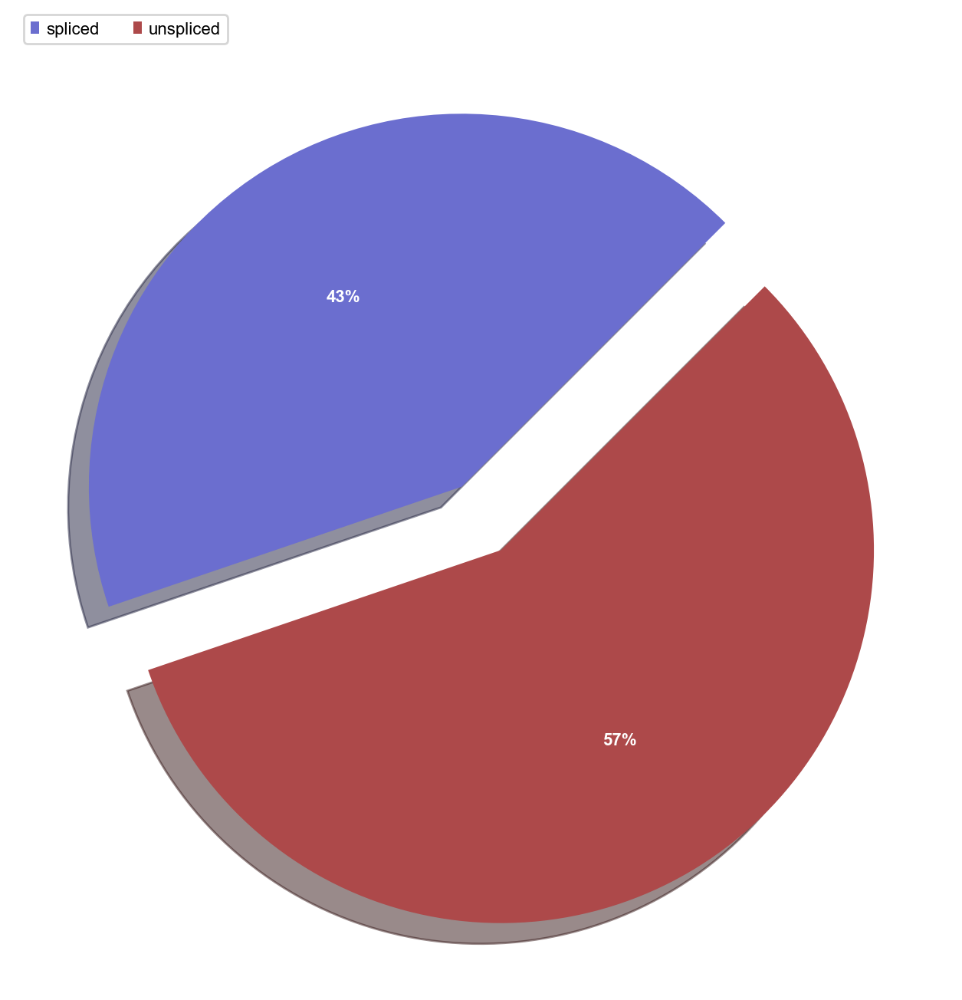

In [40]:
scv.pl.proportions(adata, figsize=(20,8), layers=['spliced','unspliced'])


pre-process steps

In [48]:
print(len(set(adata.obsm['X_umap'].sum(1))), adata.n_obs)

38438 38439


In [49]:
print(len(set(adata.layers['spliced'].sum(1).A1)), adata.n_obs)

4274 38439


In [41]:
scv.pp.filter_and_normalize(adata)

Normalized count data: X, spliced, unspliced.


In [42]:
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:29) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:10) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [15]:
adata.var.index

Index(['GRCh38_MIR1302-2HG', 'GRCh38_AL627309.1', 'GRCh38_FAM87B',
       'GRCh38_LINC00115', 'GRCh38_FAM41C', 'GRCh38_AL645608.7',
       'GRCh38_AL645608.5', 'GRCh38_AL645608.1', 'GRCh38_SAMD11',
       'GRCh38_NOC2L',
       ...
       'GRCh38_AF181450.1', 'GRCh38_AL158166.2', 'GRCh38_LINC02735',
       'GRCh38_AP002991.2', 'GRCh38_AL359436.1', 'GRCh38_AL135878.1',
       'GRCh38_AL161851.1', 'GRCh38_AC104002.1', 'GRCh38_AL121584.1',
       'GRCh38_AL451105.2'],
      dtype='object', length=30146)

In [8]:
scv.tl.recover_dynamics(adata, n_jobs=7)

recovering dynamics (using 7/8 cores)
or disable the progress bar using `show_progress_bar=False`.


/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:721: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:724: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


    finished (2:36:32) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [9]:
adata.write('/Users/lindalee/Desktop/all_timepoints_post_mito_10_and_15_CC_regression_CSS_integration_adata_w_loom_w_CSS_final_w_dynamical_05252023.h5ad')

In [3]:
adata = sc.read_h5ad('/Users/lindalee/Desktop/all_timepoints_post_mito_10_and_15_CC_regression_CSS_integration_adata_w_loom_w_CSS_final_w_velocity_graph_dynamical_and_dynamical_vel_calculated_05252023.h5ad')

In [6]:
scv.tl.velocity(adata, mode='dynamical')

computing velocities
    finished (0:29:21) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [7]:
scv.tl.velocity_graph(adata, n_jobs=8)

computing velocity graph (using 8/8 cores)
or disable the progress bar using `show_progress_bar=False`.


/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short w

    finished (0:15:37) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [8]:
adata.write('/Users/lindalee/Desktop/all_timepoints_post_mito_10_and_15_CC_regression_CSS_integration_adata_w_loom_w_CSS_final_w_velocity_graph_dynamical_and_dynamical_vel_graph_done_05252023.h5ad')

In [6]:
adata = sc.read_h5ad('/Users/lindalee/Desktop/all_timepoints_post_mito_10_and_15_CC_regression_CSS_integration_adata_w_loom_w_CSS_final_w_velocity_graph_dynamical_and_dynamical_vel_graph_done_05252023.h5ad')

computing velocity embedding
    finished (0:00:37) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_dynamical_05302023.pdf


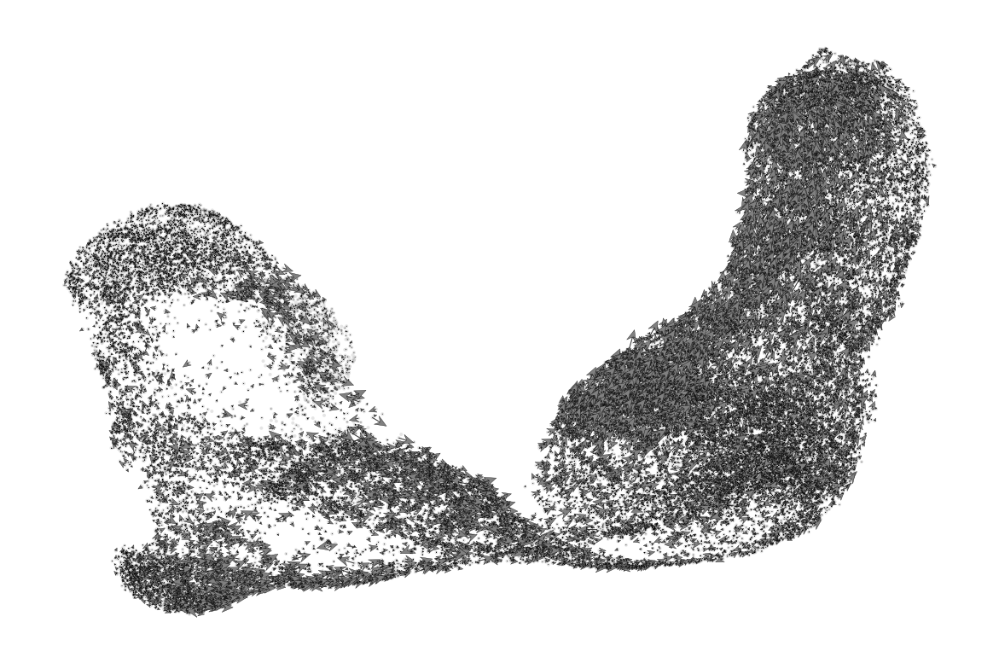

In [9]:
scv.pl.velocity_embedding(adata, basis='umap', arrow_length=3,arrow_size=2, dpi=120, frameon=False, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_dynamical_05302023.pdf')

saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_dynamical_05302023.pdf


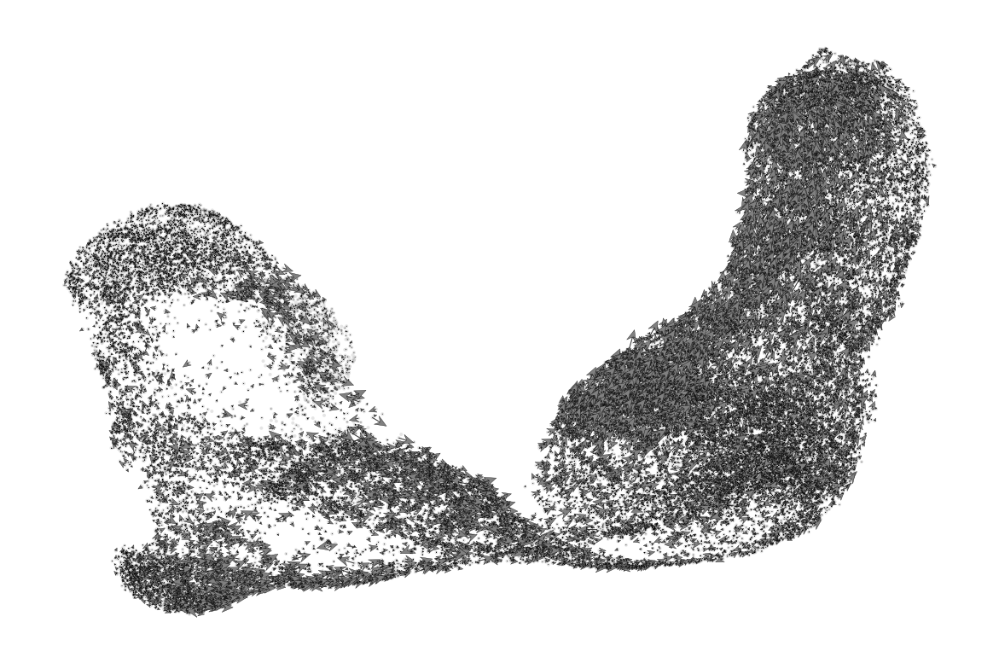

In [10]:
scv.pl.velocity_embedding(adata, basis='umap', arrow_length=3,arrow_size=2, dpi=120, frameon=False, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_dynamical_05302023.pdf')

In [16]:
import matplotlib.pyplot as plt
plt.rcParams.update({'lines.markersize' : '15'})
viridis

NameError: name 'viridis' is not defined

/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_grid_timepoint_dynamical_05302023.pdf


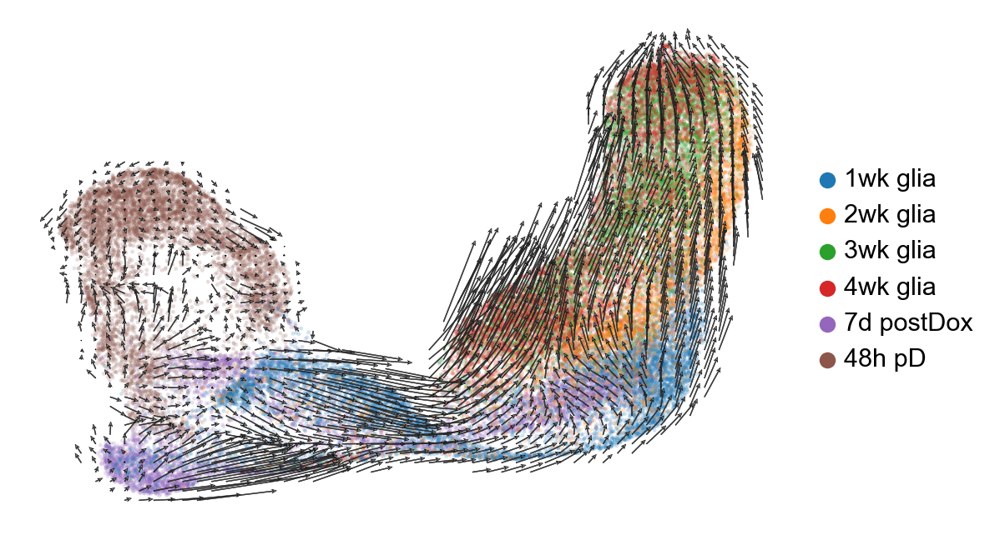

In [11]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='timepoint', smooth=.8, min_mass=2, color_map='viridis', legend_loc='right', fontsize=20,  size=12, colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_grid_timepoint_dynamical_05302023.pdf', title='', scale=0.15)

In [ ]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='timepoint', smooth=.8, min_mass=2, color_map='viridis', legend_loc='right', fontsize=20,  size=12, colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_grid_timepoint_dynamical_05302023.pdf', title='', scale=0.15)

In [103]:
adata

AnnData object with n_obs × n_vars = 36422 × 30146
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'n.hkgene', 'avg.hkgene', 'RNA_snn_res.0.6', 'seurat_clusters', 'RNA_snn_res.0.9', 'RNA_snn_res.1.2', 'RNA_snn_res.2.4', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'RNA_snn_res.0.2', 'celltypeF', 'timepoint', 'folder', 'tx', 'cell.name', 'GAD.interneuron', 'GAD1.GAD2.SLC32A1', 'CALB1_exprs', 'CALB2_exprs', 'SST_exprs', 'PVALB_exprs', 'TH_exprs', 'RELN_exprs', 'HTR3A_exprs', 'VIP_exprs', 'annotation', 'MAP2.TUBB3.DCX', 'neuronal', 'SST.bi', 'neuronal.bi', 'GAD.interneuro.bi', 'n.int', 'number', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'MULTI_ID', 'MULTI_classification', 'dual_smad', 'HTO_maxID', 'hash.IDv2', 'nCount_SCT', 'nFeature_SCT', 'batch', 'SCT_snn_res.0.2', 'SCT_snn_res.0.6', 'SCT_snn_res.0.9', 'SCT_snn_res.1.2', 'SCT_snn_res.2.4', 'neuronal.1', 'GAD.interneuron.1', 'MAP2.SST.ISL1', 'MAP2.ISL1', 'MAP2.GATA2', 'MAP2.TSC22D1', 'MAP2.KLF6',

/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


figure cannot be saved as pdf, using png instead.
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_timepoint_dynamical_05302023.png


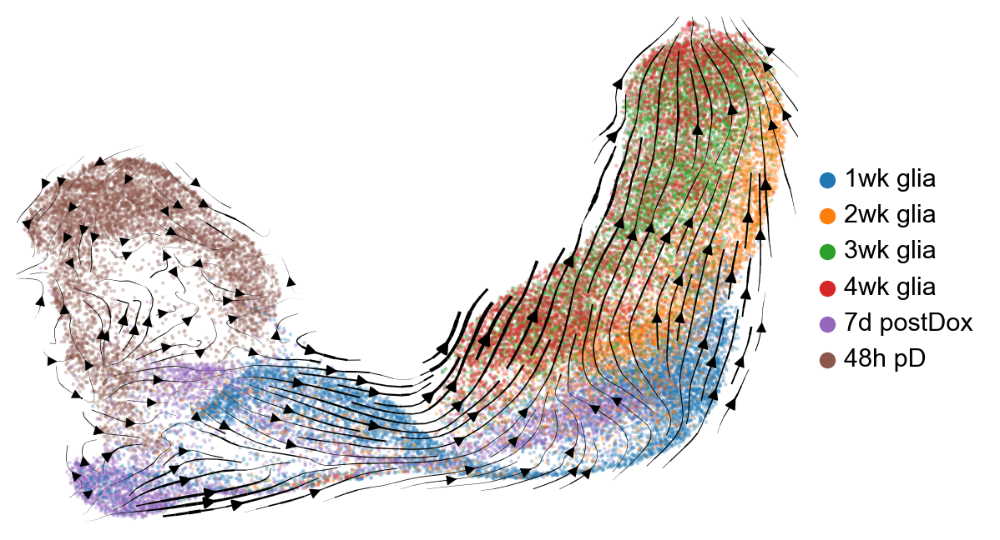

In [12]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['timepoint'], size=10, color_map='viridis', legend_loc='right', fontsize=20, colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_timepoint_dynamical_05302023.pdf', title='')


/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


figure cannot be saved as pdf, using png instead.
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_timepoint_dynamical_05302023.png


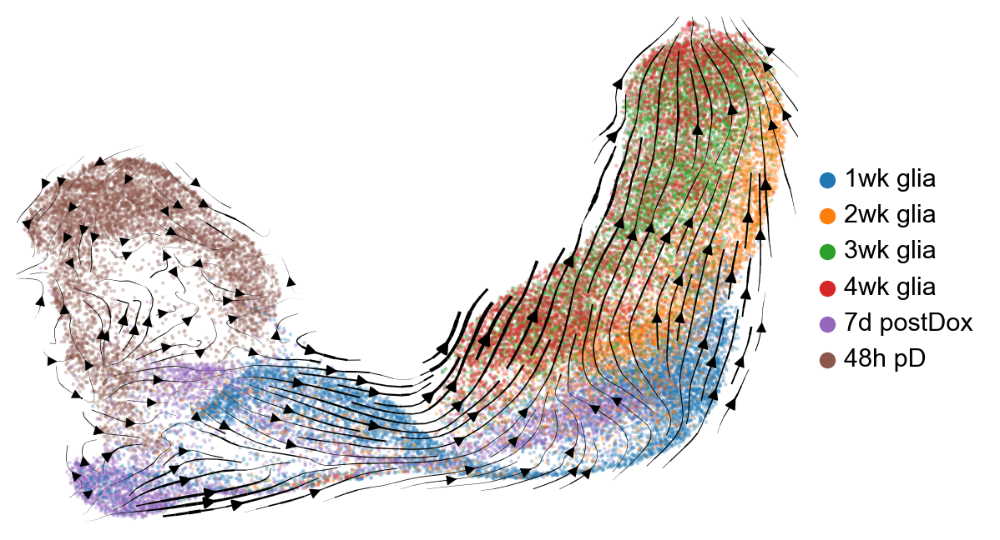

In [13]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['timepoint'], size=10, color_map='viridis', legend_loc='right', fontsize=20, colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_timepoint_dynamical_05302023.pdf', title='')


/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


figure cannot be saved as pdf, using png instead.
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_celltype_smooth_1_min_.5_dynamical_05302023.png


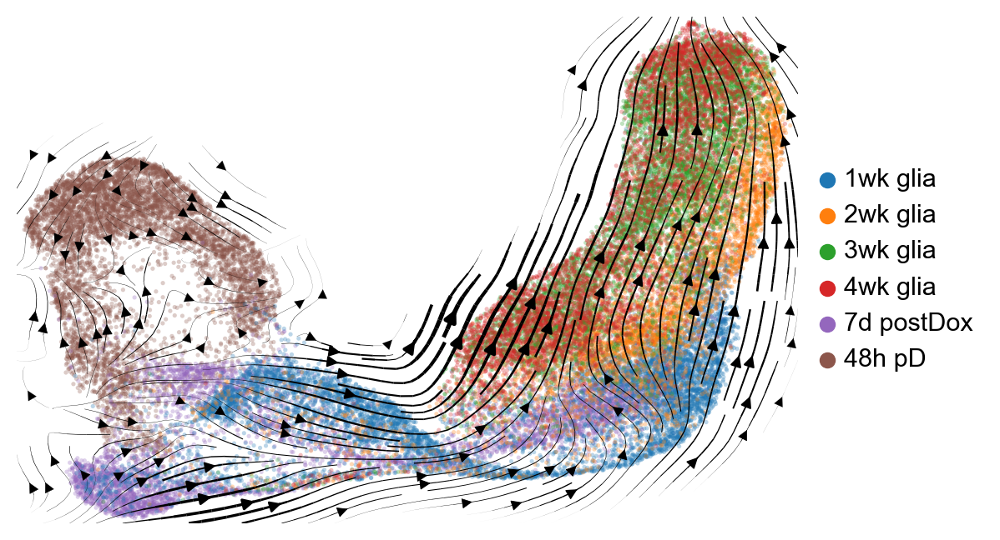

In [14]:
scv.pl.velocity_embedding_stream(adata, basis='X_umap', color_map='viridis', smooth=1, min_mass=.5, size=14, color=['timepoint'], legend_loc='right', colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_celltype_smooth_1_min_.5_dynamical_05302023.pdf', title='')


In [13]:
ident_colours = ['#E6AB02','#4DAF4A','#377EB8','#984EA3','#FF7F00','#E41A1C']


In [14]:
adata.uns['ClusterName_colors']=ident_colours

/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


figure cannot be saved as pdf, using png instead.
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_celltype_smooth_1_min_.5_dynamical_06072023_new_colors.png


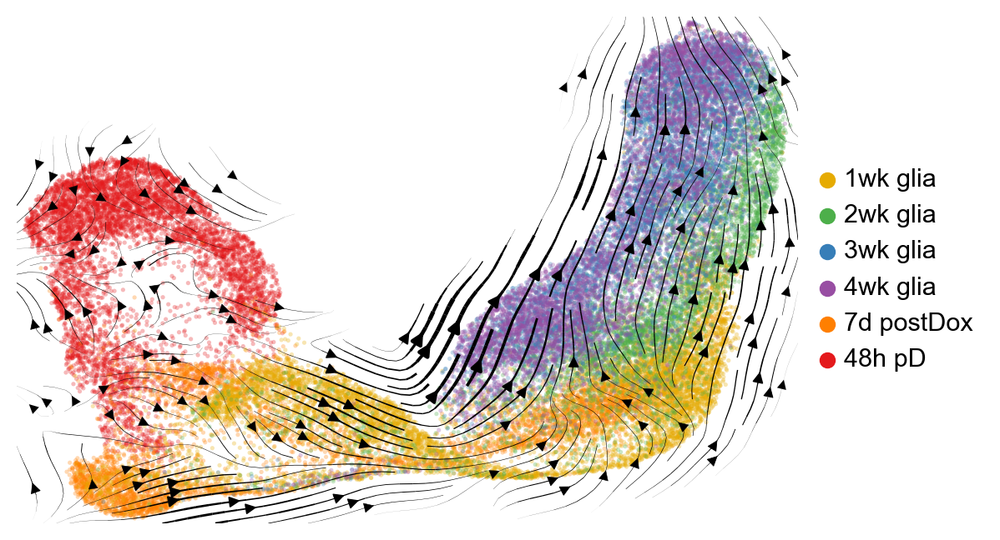

In [18]:
scv.pl.velocity_embedding_stream(adata, basis='X_umap', color_map=ident_colours, palette = ident_colours, smooth=1, min_mass=.5, size=14, color=['timepoint'], legend_loc='right', colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_celltype_smooth_1_min_.5_dynamical_06072023_new_colors.pdf', title='')


computing velocity embedding
    finished (0:01:25) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/plotting/scatter.py:614: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  smp = ax.scatter(


figure cannot be saved as pdf, using png instead.
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_celltype_smooth_1_min_.5_dynamical_05242023.png


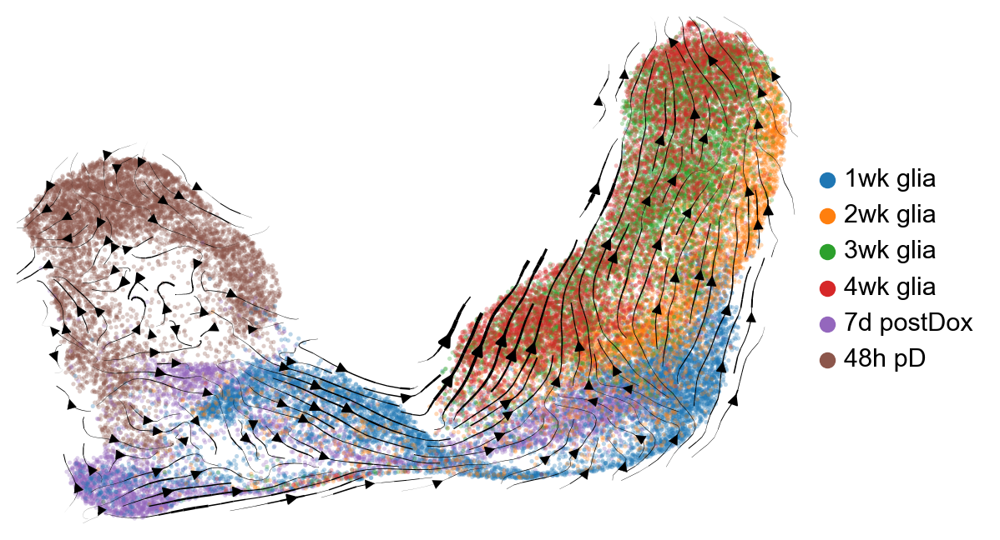

In [12]:
scv.pl.velocity_embedding_stream(adata, basis='X_umap', color_map='viridis', smooth=.5, min_mass=.5, size=14, color=['timepoint'], legend_loc='right', colorbar=True, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_embedding_stream_celltype_smooth_1_min_.5_dynamical_05242023.pdf', title='')


computing latent time using root_cells as prior
    finished (0:03:01) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file /Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_latent_time_05302023.pdf


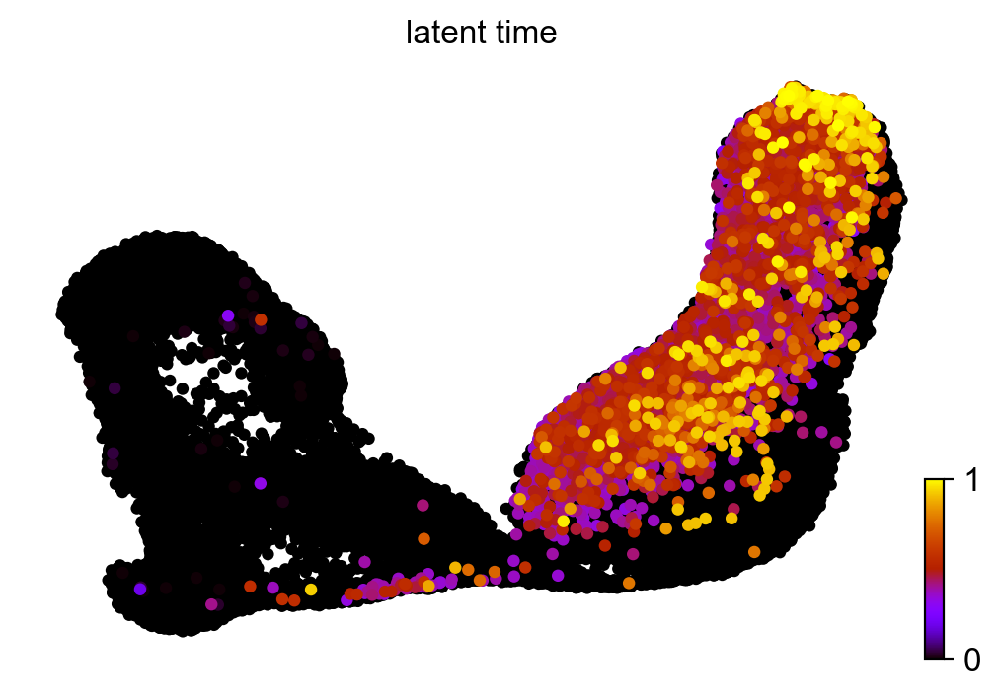

In [22]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, save='/Users/lindalee/Desktop/alltimepoints_mito_10and15_CSS_CC_regressed_latent_time_05302023.pdf')


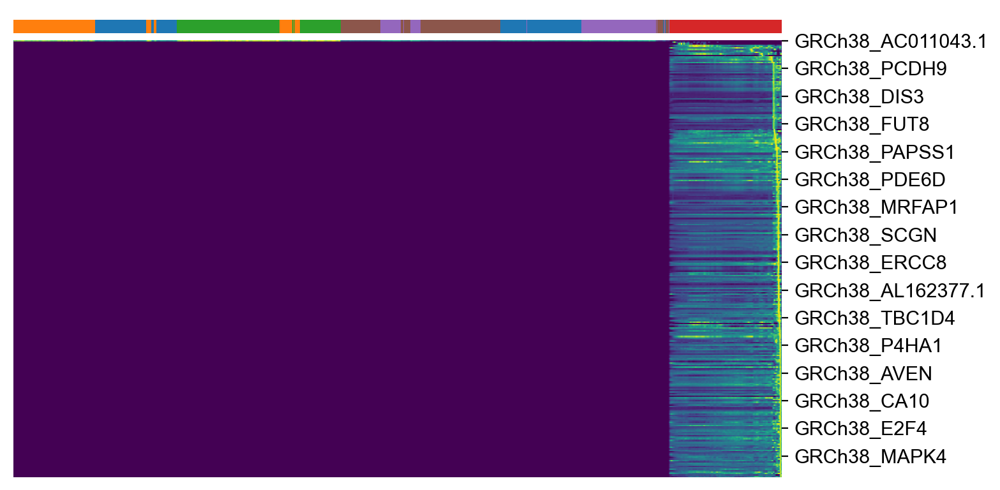

In [24]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='timepoint', n_convolve=100)


In [25]:
top_genes

Index(['GRCh38_CCR10', 'GRCh38_GNB3', 'GRCh38_MICALL2', 'GRCh38_AP001816.1',
       'GRCh38_PUS7L', 'GRCh38_ZKSCAN2', 'GRCh38_NOTCH4', 'GRCh38_ZNF26',
       'GRCh38_HMOX1', 'GRCh38_PPFIA1',
       ...
       'GRCh38_NSMAF', 'GRCh38_NPAS3', 'GRCh38_TBC1D12', 'GRCh38_ESRRG',
       'GRCh38_TSGA10', 'GRCh38_MRPS33', 'GRCh38_AMD1', 'GRCh38_QSER1',
       'GRCh38_TMEM183A', 'GRCh38_RPL10A'],
      dtype='object', length=300)

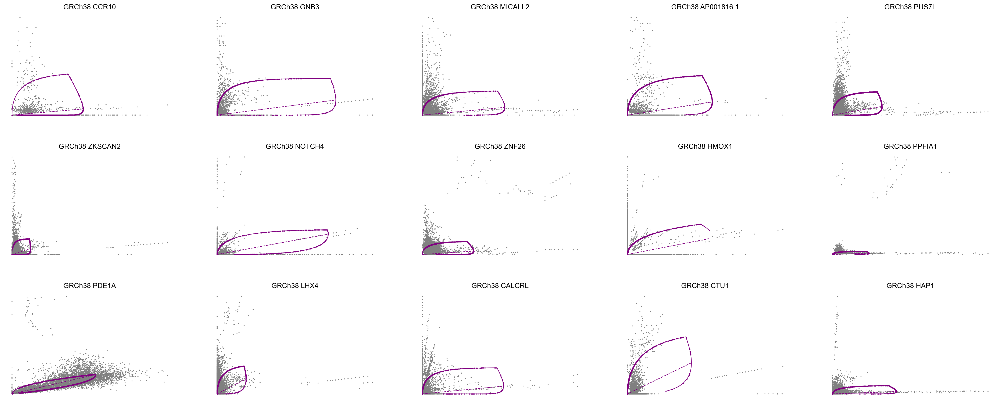

In [26]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)


In [28]:
scv.tl.rank_dynamical_genes(adata, groupby='timepoint')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:21:52) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,1wk_glia,2wk_glia,3wk_glia,4wk_glia,7d_postDox,48h_pD
0,GRCh38_AC011043.1,GRCh38_AC011043.1,GRCh38_AC011043.1,GRCh38_MCTP2,GRCh38_AC011043.1,GRCh38_AC011043.1
1,GRCh38_PSIP1,GRCh38_NDUFA7,GRCh38_RIC3,GRCh38_SMIM35,GRCh38_PRKRIP1,GRCh38_AC007325.2
2,GRCh38_RAB22A,GRCh38_IFT122,GRCh38_SPAST,GRCh38_CFAP299,GRCh38_GNL3L,GRCh38_SNX7
3,GRCh38_LINC00467,GRCh38_ABCF1,GRCh38_PPIL4,GRCh38_KCNQ3,GRCh38_CORO2B,GRCh38_SNRNP200
4,GRCh38_SENP1,GRCh38_SNHG16,GRCh38_PIGC,GRCh38_CNKSR3,GRCh38_NAMPT,GRCh38_CEP131


In [31]:
df.to_csv("~/Desktop/scvelo_dynamical_genes_by_timepoint_05302023.csv")

In [7]:
scv.tl.velocity_graph(adata, mode_neighbors='connectivities')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


computing velocity graph (using 1/8 cores)
or disable the progress bar using `show_progress_bar=False`.


/opt/anaconda3/envs/scvelo/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:41) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [8]:
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

computing terminal states
    identified 4 regions of root cells and 4 regions of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:02:45) --> added 
    'latent_time', shared time (adata.obs)


saving figure to file /Users/lindalee/Desktop/root_cells_end_points_dynamical_05302023.pdf


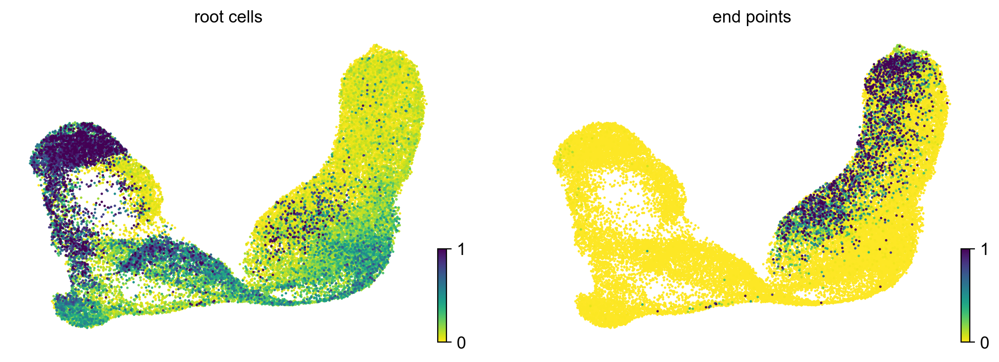

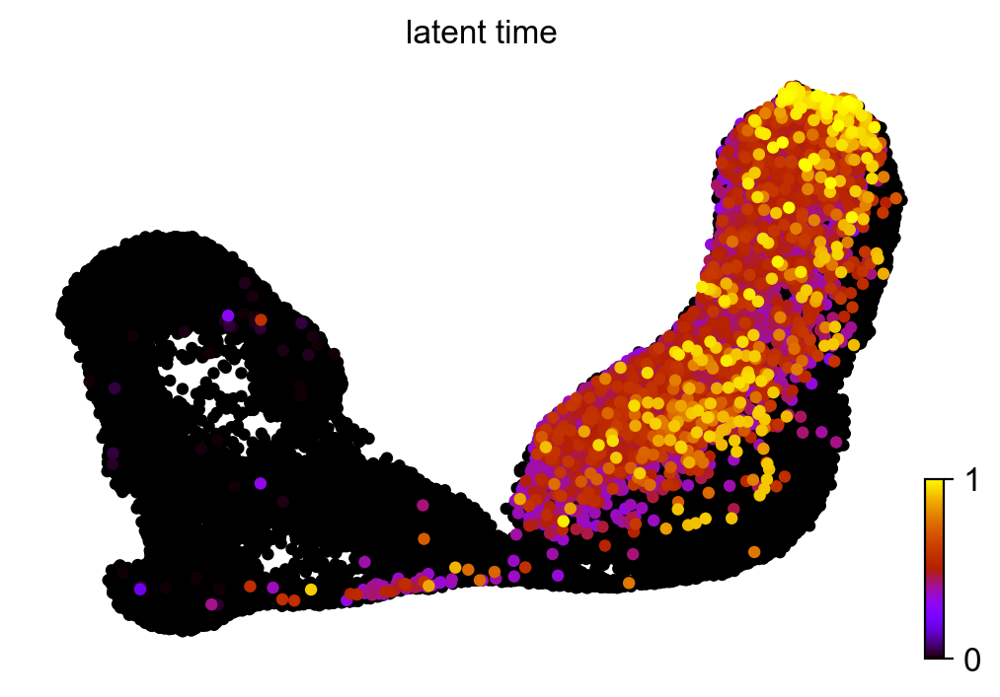

In [11]:
scv.pl.scatter(adata, color=[ 'root_cells', 'end_points'], save = "/Users/lindalee/Desktop/root_cells_end_points_dynamical_05302023.pdf")
scv.pl.scatter(adata, color='latent_time',color_map='gnuplot', size=80)